In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import metrics
import pandas_profiling as pp
from dataprep.eda import plot_correlation

NumExpr defaulting to 8 threads.


In [2]:
data = pd.read_csv(r'C:\Users\Yukesh\Downloads\Dataset\weatherAUS.csv')

In [3]:
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
data['Date'] = pd.to_datetime(data['Date'])

In [5]:
data = data[~(data['RainToday'].isnull()) & ~(data['RainTomorrow'].isnull())]

In [6]:
min_temp=[]
mean_rain = data[data['RainToday']=='Yes'].MinTemp.mean()
mean_norain = data[data['RainToday']=='No'].MinTemp.mean()


for i,j in zip(data['MinTemp'].fillna(np.nan),data['RainToday']):
    if str(i) == 'nan':
        if(j=='Yes'):
            min_temp.append(mean_rain)
        else:
            min_temp.append(mean_norain)
    else:
        min_temp.append(i)

In [7]:
data['MinTemp'] = min_temp

In [8]:
max_temp=[]
mean_rain = data[data['RainToday']=='Yes'].MaxTemp.mean()
mean_norain = data[data['RainToday']=='No'].MaxTemp.mean()


for i,j in zip(data['MaxTemp'].fillna(np.nan),data['RainToday']):
    if str(i) == 'nan':
        if(j=='Yes'):
            max_temp.append(mean_rain)
        else:
            max_temp.append(mean_norain)
    else:
        max_temp.append(i)

In [9]:
data['MaxTemp']= max_temp

In [10]:
data.drop(['Cloud9am','Cloud3pm'],inplace = True,axis=1)

In [11]:
data.drop('Evaporation',axis=1,inplace = True)
data.drop('Sunshine',axis=1,inplace = True)

In [12]:
data['WindGustDir'] = data['WindGustDir'].fillna(method='ffill')
data['WindGustSpeed'] = data['WindGustSpeed'].fillna(method='ffill')

In [13]:
winddir3pm=[]
a=data['WindDir9am'].values
b=data['WindDir3pm'].values

for i,j in enumerate(a):
    if str(j)=='nan':
        winddir3pm.append(b[i-1])
    else:
        winddir3pm.append(a[i])

In [14]:
len(winddir3pm)

140787

In [15]:
data['WindDir9am'] = winddir3pm

In [16]:
winddir9am=[]
a=data['WindDir3pm'].values
b=data['WindDir9am'].values

for i,j in enumerate(a):
    if str(j)=='nan':
        winddir9am.append(b[i])
    else:
        winddir9am.append(a[i])

In [17]:
data['WindDir3pm'] = winddir9am

In [18]:
data.dropna(subset = ['WindDir9am','WindDir3pm'],inplace = True)

In [19]:
windspeed3pm=[]
a=data['WindSpeed9am'].values
b=data['WindSpeed3pm'].values

for i,j in enumerate(a):
    if str(j)=='nan':
        windspeed3pm.append(b[i-1])
    else:
        windspeed3pm.append(a[i])

In [20]:
data['WindSpeed9am'] = windspeed3pm

In [21]:
windspeed9am=[]
a=data['WindSpeed3pm'].values
b=data['WindSpeed9am'].values

for i,j in enumerate(a):
    if str(j)=='nan':
        windspeed9am.append(b[i])
    else:
        windspeed9am.append(a[i])

In [22]:
data['WindSpeed3pm'] = windspeed9am

In [23]:
data.dropna(subset=['WindSpeed9am','WindSpeed3pm'],inplace = True)

In [24]:
humidity3pm=[]
a=data['Humidity9am'].values
b=data['Humidity3pm'].values

for i,j in enumerate(a):
    if str(j)=='nan':
        humidity3pm.append(b[i-1])
    else:
        humidity3pm.append(a[i])

In [25]:
data['Humidity9am'] = humidity3pm

In [26]:
humidity9am=[]
a=data['Humidity3pm'].values
b=data['Humidity9am'].values

for i,j in enumerate(a):
    if str(j)=='nan':
        humidity9am.append(b[i])
    else:
        humidity9am.append(a[i])

In [27]:
data['Humidity3pm'] = humidity9am

In [28]:
data.dropna(subset=['Humidity9am','Humidity3pm'],inplace= True)

In [29]:
data.isnull().sum()

Date                 0
Location             0
MinTemp              0
MaxTemp              0
Rainfall             0
WindGustDir          0
WindGustSpeed        0
WindDir9am           0
WindDir3pm           0
WindSpeed9am         0
WindSpeed3pm         0
Humidity9am          0
Humidity3pm          0
Pressure9am      12438
Pressure3pm      12470
Temp9am            416
Temp3pm           2145
RainToday            0
RainTomorrow         0
dtype: int64

In [30]:
pressure3pm=[]
a=data['Pressure9am'].values
b=data['Pressure3pm'].values

for i,j in enumerate(a):
    if str(j)=='nan':
        pressure3pm.append(b[i-1])
    else:
        pressure3pm.append(a[i])

In [31]:
data[data['Pressure9am'].isnull()]

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
5328,2015-07-06,BadgerysCreek,-1.300000,16.0,0.0,WSW,33.0,N,WSW,0.0,20.0,100.0,41.0,NaN,NaN,3.8,15.4,No,No
5329,2015-07-07,BadgerysCreek,2.900000,14.8,0.0,SSW,35.0,SSE,SW,4.0,7.0,75.0,71.0,NaN,NaN,8.2,13.2,No,No
5330,2015-07-08,BadgerysCreek,2.800000,16.1,0.0,SW,19.0,SW,ENE,15.0,6.0,100.0,62.0,NaN,NaN,8.2,14.9,No,No
5331,2015-07-09,BadgerysCreek,1.600000,16.2,0.0,N,22.0,ENE,NNE,0.0,15.0,100.0,58.0,NaN,NaN,6.9,15.5,No,No
5332,2015-07-10,BadgerysCreek,2.300000,11.9,0.0,WSW,22.0,NNE,WSW,4.0,11.0,100.0,92.0,NaN,NaN,7.9,11.4,No,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136068,2017-06-23,Launceston,4.700000,12.8,5.4,WNW,48.0,NNW,NNW,17.0,24.0,90.0,83.0,NaN,NaN,10.1,12.4,Yes,Yes
136069,2017-06-24,Launceston,-0.500000,11.4,8.6,NW,28.0,SW,NNW,2.0,15.0,96.0,58.0,NaN,NaN,1.9,11.0,Yes,No
136070,2017-06-25,Launceston,1.800000,12.8,0.0,NW,50.0,NNW,NNW,15.0,17.0,84.0,73.0,NaN,NaN,9.4,12.4,No,No
138166,2014-11-24,AliceSprings,12.855535,34.9,5.0,SE,43.0,NNW,W,19.0,7.0,57.0,32.0,NaN,NaN,27.3,33.8,Yes,No


In [32]:
data.dropna(subset=['Pressure9am','Pressure3pm'],inplace = True)

In [33]:
temp3pm=[]
a=data['Temp9am'].values
b=data['Temp3pm'].values

for i,j in enumerate(a):
    if str(j)=='nan':
        temp3pm.append(b[i-1])
    else:
        temp3pm.append(a[i])

In [34]:
data['Temp9am'] = temp3pm

In [35]:
data.dropna(inplace = True)

In [36]:
data.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [37]:
pp.ProfileReport(data)

Summarize dataset:   0%|          | 0/33 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

100%|############################################################################################| 4/4 [00:00<…


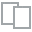
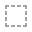
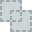
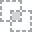
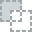
...
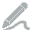
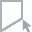
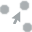
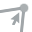
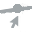

In [38]:
plot_correlation(data)

In [39]:
data.drop('MaxTemp',axis=1,inplace = True)

In [40]:
data['RainToday'] = data['RainToday'].map({'Yes':1,'No':0})
data['RainTomorrow'] = data['RainTomorrow'].map({'Yes':1,'No':0})

In [41]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 124489 entries, 0 to 145458
Data columns (total 18 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Date           124489 non-null  datetime64[ns]
 1   Location       124489 non-null  object        
 2   MinTemp        124489 non-null  float64       
 3   Rainfall       124489 non-null  float64       
 4   WindGustDir    124489 non-null  object        
 5   WindGustSpeed  124489 non-null  float64       
 6   WindDir9am     124489 non-null  object        
 7   WindDir3pm     124489 non-null  object        
 8   WindSpeed9am   124489 non-null  float64       
 9   WindSpeed3pm   124489 non-null  float64       
 10  Humidity9am    124489 non-null  float64       
 11  Humidity3pm    124489 non-null  float64       
 12  Pressure9am    124489 non-null  float64       
 13  Pressure3pm    124489 non-null  float64       
 14  Temp9am        124489 non-null  float64       
 15  

In [42]:
data['WindGustDir'].unique()

array(['W', 'WNW', 'WSW', 'NE', 'NNW', 'N', 'NNE', 'SW', 'ENE', 'SSE',
       'S', 'NW', 'SE', 'ESE', 'E', 'SSW'], dtype=object)

In [43]:
data['WindGustDir'] = data['WindGustDir'].map({'W':1, 'WNW':2, 'WSW':3, 'NE':4, 'NNW':5, 'N':6, 'NNE':7,
                                               'SW':8, 'ENE':9, 'SSE':10,'S':11, 'NW':12, 'SE':13,
                                               'ESE':14, 'E':15, 'SSW':16})

In [44]:
data['WindDir9am'] = data['WindDir9am'].map({'W':1, 'WNW':2, 'WSW':3, 'NE':4, 'NNW':5, 'N':6, 'NNE':7,
                                               'SW':8, 'ENE':9, 'SSE':10,'S':11, 'NW':12, 'SE':13,
                                               'ESE':14, 'E':15, 'SSW':16})

In [45]:
data['WindDir3pm'] = data['WindDir3pm'].map({'W':1, 'WNW':2, 'WSW':3, 'NE':4, 'NNW':5, 'N':6, 'NNE':7,
                                               'SW':8, 'ENE':9, 'SSE':10,'S':11, 'NW':12, 'SE':13,
                                               'ESE':14, 'E':15, 'SSW':16})

In [46]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 124489 entries, 0 to 145458
Data columns (total 18 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Date           124489 non-null  datetime64[ns]
 1   Location       124489 non-null  object        
 2   MinTemp        124489 non-null  float64       
 3   Rainfall       124489 non-null  float64       
 4   WindGustDir    124489 non-null  int64         
 5   WindGustSpeed  124489 non-null  float64       
 6   WindDir9am     124489 non-null  int64         
 7   WindDir3pm     124489 non-null  int64         
 8   WindSpeed9am   124489 non-null  float64       
 9   WindSpeed3pm   124489 non-null  float64       
 10  Humidity9am    124489 non-null  float64       
 11  Humidity3pm    124489 non-null  float64       
 12  Pressure9am    124489 non-null  float64       
 13  Pressure3pm    124489 non-null  float64       
 14  Temp9am        124489 non-null  float64       
 15  

C:\Users\Yukesh\anaconda3\lib\site-packages\scipy\stats\stats.py:4594: RuntimeWarning: overflow encountered in longlong_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


100%|############################################################################################| 4/4 [00:00<…


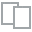
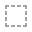
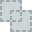
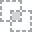
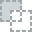
...
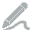
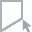
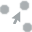
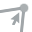
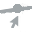

In [47]:
plot_correlation(data)

In [48]:
data.drop('Pressure3pm',axis=1,inplace = True)

In [49]:
from sklearn.preprocessing import MinMaxScaler

In [50]:
x = data.drop(['Date','Location','RainTomorrow'],axis=1)
y = data['RainTomorrow']

In [51]:
from sklearn.feature_selection import RFE
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

In [52]:
x_train,x_test,y_train,y_test = train_test_split(x,y,stratify=y)

scaler = MinMaxScaler()

x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [53]:
lr = LogisticRegression()

rfe = RFE(lr,10)
rfe.fit(x_train,y_train)

C:\Users\Yukesh\anaconda3\lib\site-packages\sklearn\utils\validation.py:70: FutureWarning: Pass n_features_to_select=10 as keyword args. From version 1.0 (renaming of 0.25) passing these as positional arguments will result in an error
  warnings.warn(f"Pass {args_msg} as keyword args. From version "
C:\Users\Yukesh\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


RFE(estimator=LogisticRegression(), n_features_to_select=10)

In [54]:
list(zip(x.columns,rfe.support_,rfe.ranking_))

[('MinTemp', False, 2),
 ('Rainfall', True, 1),
 ('WindGustDir', False, 4),
 ('WindGustSpeed', True, 1),
 ('WindDir9am', False, 3),
 ('WindDir3pm', True, 1),
 ('WindSpeed9am', True, 1),
 ('WindSpeed3pm', True, 1),
 ('Humidity9am', False, 5),
 ('Humidity3pm', True, 1),
 ('Pressure9am', True, 1),
 ('Temp9am', True, 1),
 ('Temp3pm', True, 1),
 ('RainToday', True, 1)]

In [55]:
x.columns[rfe.support_]

Index(['Rainfall', 'WindGustSpeed', 'WindDir3pm', 'WindSpeed9am',
       'WindSpeed3pm', 'Humidity3pm', 'Pressure9am', 'Temp9am', 'Temp3pm',
       'RainToday'],
      dtype='object')

In [56]:
lr.fit(x_train,y_train)

C:\Users\Yukesh\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [57]:
lr.predict(x_test)

array([1, 0, 0, ..., 0, 0, 1], dtype=int64)

In [58]:
prediction = pd.DataFrame(columns= ['Probabilities'])

In [59]:
prediction['Probabilities'] = lr.predict_proba(x_test)[:,1]

In [60]:
prediction

,Probabilities
0,0.523789
1,0.237477
2,0.005619
3,0.196616
4,0.092522
...,...
31118,0.226210
31119,0.746726
31120,0.202239
31121,0.017590


In [61]:
a = [i/10 for i in range(10)]

for i in a:
    prediction[i] = prediction.Probabilities.apply(lambda x: 1 if x>i else 0)
    
prediction

,Probabilities,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0.523789,1,1,1,1,1,1,0,0,0,0
1,0.237477,1,1,1,0,0,0,0,0,0,0
2,0.005619,1,0,0,0,0,0,0,0,0,0
3,0.196616,1,1,0,0,0,0,0,0,0,0
4,0.092522,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
31118,0.226210,1,1,1,0,0,0,0,0,0,0
31119,0.746726,1,1,1,1,1,1,1,1,0,0
31120,0.202239,1,1,1,0,0,0,0,0,0,0
31121,0.017590,1,0,0,0,0,0,0,0,0,0


In [62]:
metrics.accuracy_score(y_test,lr.predict(x_test))

0.8464158339491694

In [63]:
metrics.confusion_matrix(y_test,lr.predict(x_test))

array([[23033,  1212],
       [ 3568,  3310]], dtype=int64)

In [64]:
def draw_roc(actual,proba):
    fpr,tpr,threshold = metrics.roc_curve(actual,proba,drop_intermediate=False)
    plt.figure(figsize=(10,10))
    plt.plot(fpr,tpr)
    plt.plot([0,1],[0,1],'k--')
    plt.xlim(0,1.0)
    plt.ylim(0,1.0)
    plt.title('ROC Curve')

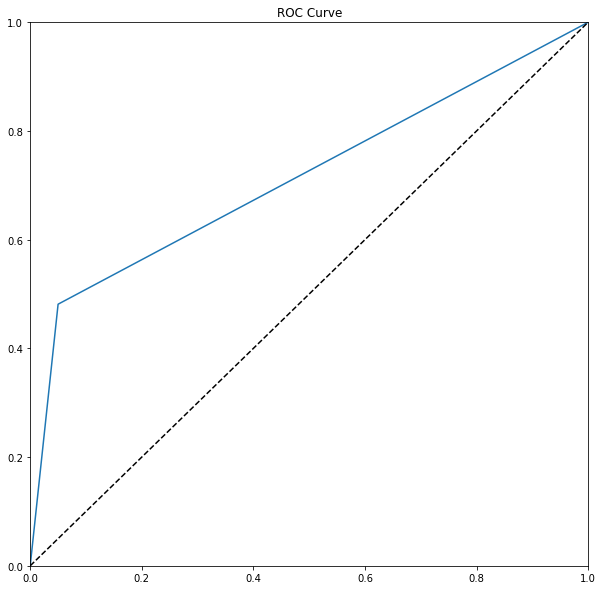

In [65]:
draw_roc(y_test,lr.predict(x_test))

In [67]:
for i in a:
    c = prediction['Probabilities'].apply(lambda x:1 if x>i else 0)
    print(metrics.accuracy_score(y_test,c))

0.22099412010410308
0.6342576229797898
0.7691417922436783
0.8206792404331202
0.8410178967323202
0.8464158339491694
0.8419496835138001
0.833402949587122
0.8164701346271246
0.7960672171705813


In [74]:
accuracyDF = pd.DataFrame(columns = ['sensitivity','specificity','threshold'])

In [99]:
accuracyDF['threshold'] = a 
accuracyDF['accuracy'] = a

for j,i in enumerate(a):
    
    label = prediction.Probabilities.apply(lambda x:1 if x>i else 0)
    accuracy_score = metrics.accuracy_score(y_test,label)
    confusion_matrix = metrics.confusion_matrix(y_test,label)
    TP = confusion_matrix[1,1] 
    FP = confusion_matrix[0,1] 
    TN = confusion_matrix[0,0] 
    FN = confusion_matrix[1,0] 
    sensitivity = TP/(FN+TP)
    specificity = TN/(TN+FP)
    accuracyDF['sensitivity'][j] = sensitivity
    accuracyDF['specificity'][j] = specificity
    accuracyDF['accuracy'][j] = accuracy_score

<ipython-input-99-1d147070f5a3>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  accuracyDF['sensitivity'][j] = sensitivity
<ipython-input-99-1d147070f5a3>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  accuracyDF['specificity'][j] = specificity
<ipython-input-99-1d147070f5a3>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  accuracyDF['accuracy'][j] = accuracy_score
<ipython-input-99-1d147070f5a3>:15: SettingWithCopyWarning: 
A v

In [100]:
accuracyDF

,sensitivity,specificity,threshold,accuracy
0,1.0,0.0,0.0,0.220994
1,0.901861,0.558342,0.1,0.634258
2,0.77508,0.767457,0.2,0.769142
3,0.674615,0.862116,0.3,0.820679
4,0.57793,0.915653,0.4,0.841018
5,0.481245,0.95001,0.5,0.846416
6,0.387322,0.970922,0.6,0.841950
7,0.296889,0.985605,0.7,0.833403
8,0.191625,0.993731,0.8,0.816470
9,0.083745,0.998144,0.9,0.796067


In [106]:
accuracyDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   sensitivity  10 non-null     object 
 1   specificity  10 non-null     object 
 2   threshold    10 non-null     float64
 3   accuracy     10 non-null     float64
dtypes: float64(2), object(2)
memory usage: 448.0+ bytes


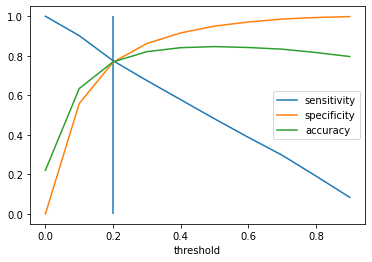

In [116]:
accuracyDF.plot(x = 'threshold',y=['sensitivity','specificity','accuracy'])
plt.vlines(x=0.2,ymin=0,ymax=1)